In [16]:
# Loading all needed packages at the start
import elastix
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import os
import SimpleITK as sitk
import numpy as np
import shutil

## **Fill in your own paths in the cell**




In [17]:
# to Elastix.exe
ELASTIX_PATH=r"C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\elastix.exe"
el = elastix.ElastixInterface(elastix_path=ELASTIX_PATH)

# to Transformix.exe
TRANSFORMIX_PATH=r"C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\transformix.exe"

# to Training Data
filepath_data = r"C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData"
## Use this in the notebook

### Load patient data and inspect


In [18]:
patient_nrs_list = ['p102','p107', 'p108', 'p109', 'p115', 'p116', 'p117', 
                    'p119', 'p120', 'p125', 'p127','p128', 'p129', 'p133', 'p135']

patient_nr = patient_nrs_list[1] #pick any index up to 14 for that patient
file_p_mr = filepath_data+ '\{}\mr_bffe.mhd'.format(patient_nr)  # example of patient 107 input MR image
file_p_mask = filepath_data+'\{}\prostaat.mhd'.format(patient_nr) # example of patient 107 segmentation mask

print(file_p_mr)
print(file_p_mask)

# Convert so images can be inspected
readable_mr = imageio.imread(file_p_mr)
readable_mask = imageio.imread(file_p_mask)


C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p107\mr_bffe.mhd
C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p107\prostaat.mhd


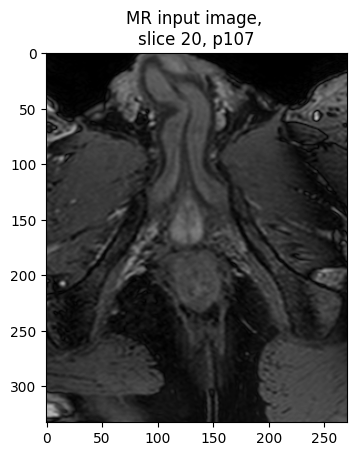

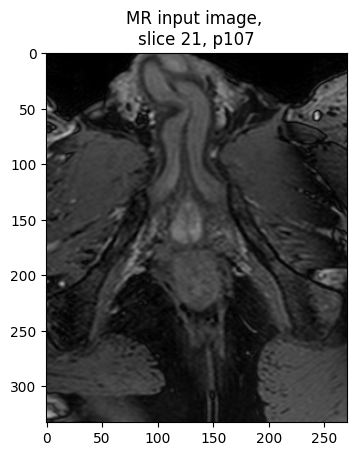

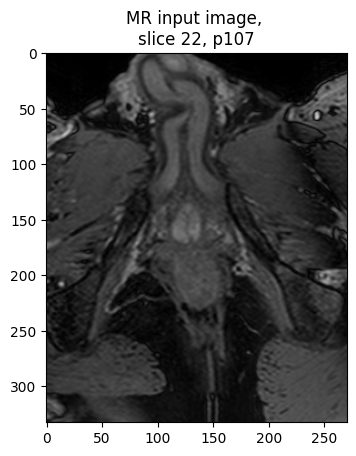

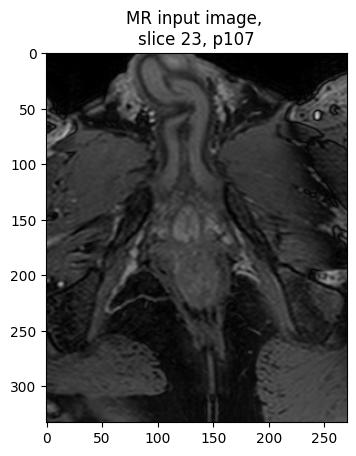

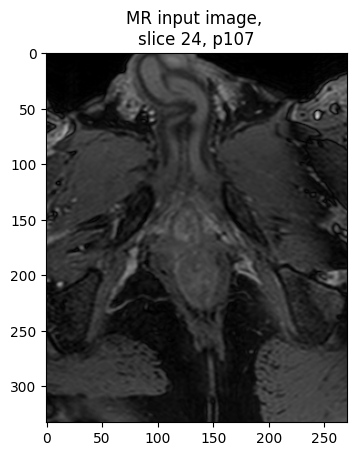

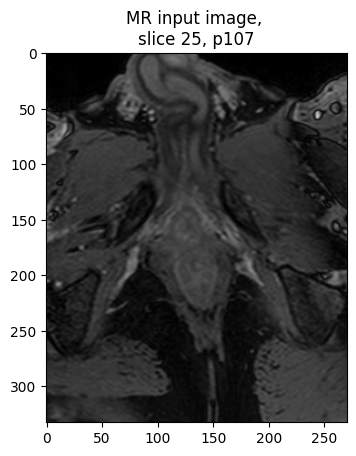

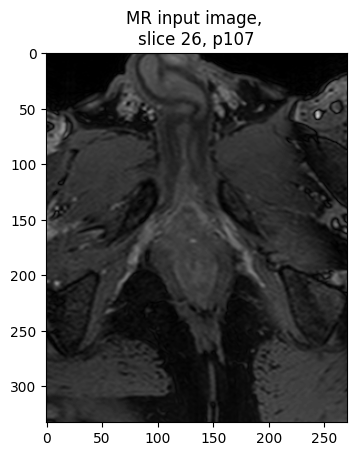

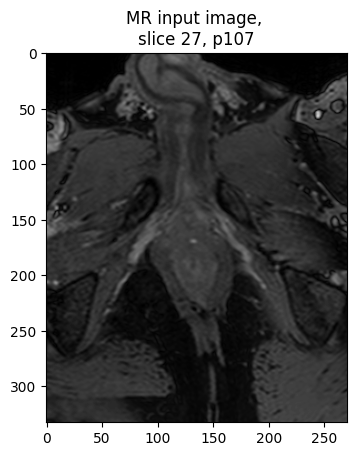

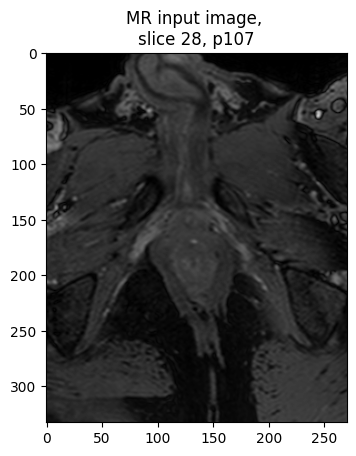

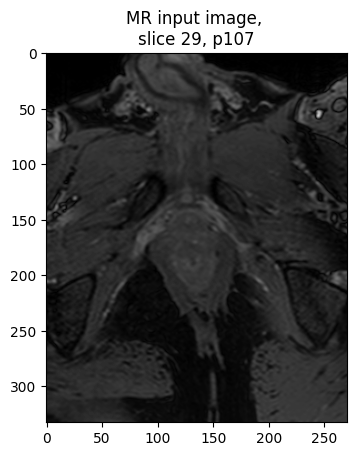

In [19]:
for i in range(20,30):
    plt.imshow(readable_mr[i,:,:], cmap='gray') 
    plt.imshow(readable_mask[i,:,:], cmap="gray",alpha =0.2) 
    
    plt.title('MR input image, \nslice {}, {}'.format(i, patient_nr))
    plt.show()

## Preparation before transformation


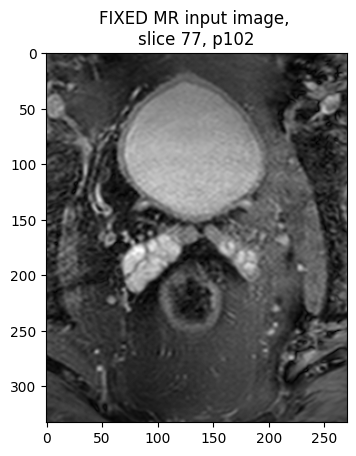

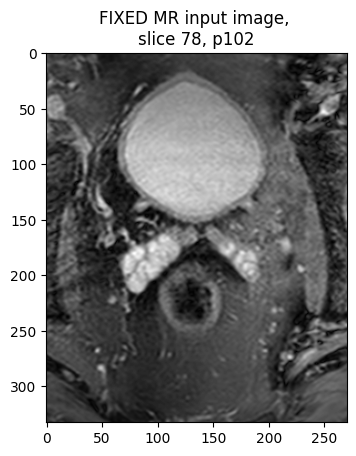

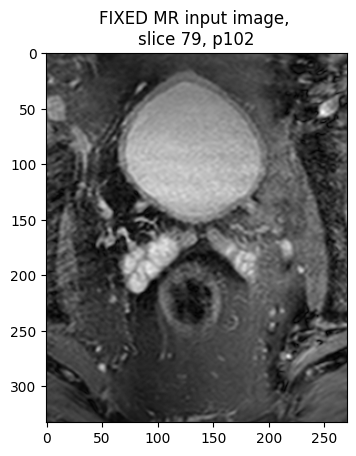

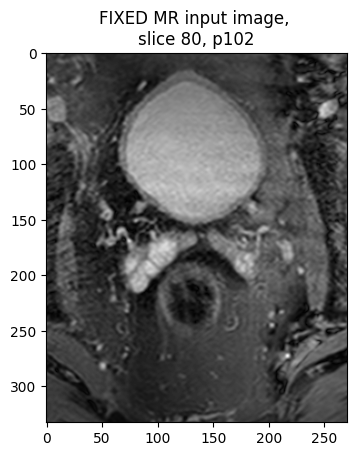

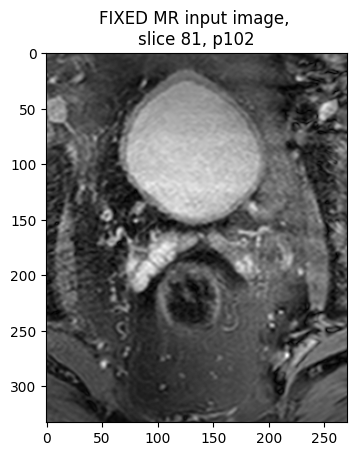

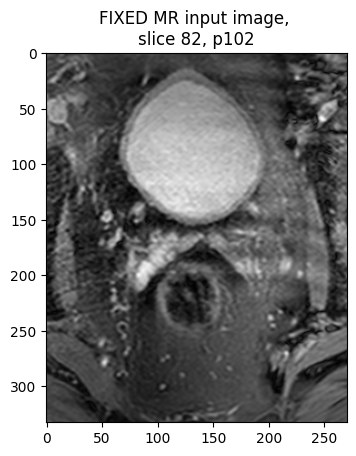

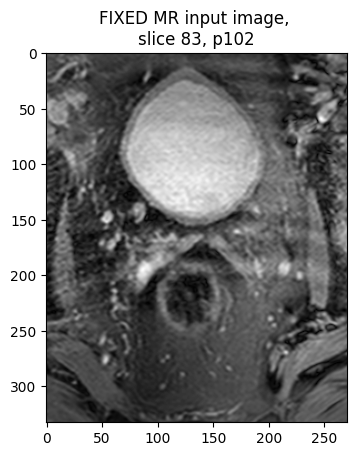

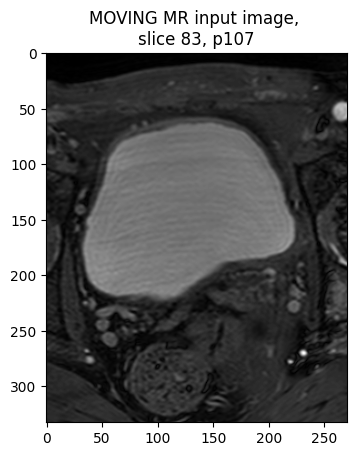

In [29]:

# register these two images 
patient_fixed= patient_nrs_list[0] 
patient_moving= patient_nrs_list[1] 


#load images
#fixed_image_path =r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\mr_bffe.mhd'
#moving_image_path = r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\mr_bffe.mhd'
fixed_image_path = filepath_data+ '\{}\mr_bffe.mhd'.format(patient_fixed)
moving_image_path = filepath_data+ '\{}\mr_bffe.mhd'.format(patient_moving)

readable_fixed = imageio.imread(fixed_image_path)
readable_moving = imageio.imread(moving_image_path)

# visualize the images
for i in range(77,84):
    plt.imshow(readable_fixed[i,:,:], cmap='gray') 
    plt.title('FIXED MR input image, \nslice {}, {}'.format(i, patient_fixed))

    plt.show()

    plt.imshow(readable_moving[i,:,:], cmap='gray') 
    plt.title('MOVING MR input image, \nslice {}, {}'.format(i, patient_moving))


In [26]:
# create a 2D image of each slice

itk_image_fixed = sitk.ReadImage(fixed_image_path)
itk_image_moving = sitk.ReadImage(moving_image_path)

for i in range(86): 
    #itk_img = itk_image_fixed[i,:,:] # itk_img is not used in the rest of this code, why was it there?
    itk_img_array = sitk.GetArrayFromImage(itk_image_fixed)
    slice = sitk.GetImageFromArray(itk_img_array[i,:,:])
    path_fixed = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    sitk.WriteImage(slice,path_fixed)
    
    #itk_img_moving = itk_image_moving[i,:,:] # itk_img_moving is not used in the rest of this code, why was it there?
    itk_img_array_moving = sitk.GetArrayFromImage(itk_image_moving)
    slice = sitk.GetImageFromArray(itk_img_array_moving[i,:,:])
    path_moving = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    sitk.WriteImage(slice,path_moving)
      


# B SPLINES TRANSFORMATION


In [32]:
# apply the bspline transformation to each affine transformed slice 
parameter_file_bsplines = os.path.join(filepath_data,'parameters_penalty.txt') # path to bsplines parameter file 
path_fixed = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_fixed, patient_fixed, 85)

for i in range(77,84): #86 for all slices
    path_moving = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    
    if not os.path.exists(os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i)))
    #output_file_path_experiment2 = os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i))
    output_file_path_bspline = os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))
    
    #output_file_path_experiment1 = os.path.join(filepath_data,'p107\\affine_results_{}'.format(i)) #moet affine zijn
    #result_path_experiment1 = os.path.join(output_file_path_experiment1, 'result.0.mhd')
    #output_file_path_affine = os.path.join(filepath_data,'{}\\affine_results_{}'.format(patient_fixed,i))
    #result_path_affine = os.path.join(output_file_path_affine, 'result.0.mhd')

    
       
    #el.register(
    #fixed_image=fixed_image_path2,
    #moving_image=result_path_experiment1,  # now moving image is the result from affine transformation
    #parameters=[parameter_file_bsplines],
    #output_dir=output_file_path_experiment2)
    
    el.register(
    fixed_image=path_fixed,
    moving_image=path_moving,  # result_path_affine,  # now the moving image is the result from affine transformation
    parameters=[parameter_file_bsplines],
    output_dir=output_file_path_bspline)


C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\elastix.exe -f C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\p102_slice85.mhd -m C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p107\p107_slice77.mhd -p C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\parameters_penalty.txt -out C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\bspline_results_77
C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\elastix.exe -f C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\p102_slice85.mhd -m C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p107\p107_slice78.mhd -p C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\parameters_penalty.txt -

C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\bspline_results_77\result.0.mhd
C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\bspline_results_78\result.0.mhd
C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\bspline_results_79\result.0.mhd
C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\bspline_results_80\result.0.mhd
C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\bspline_results_81\result.0.mhd
C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\bspline_results_82\result.0.mhd
C:\Users\esmee\OneDrive - TU Eindhoven\2022 - 2023\Q3\8DM20\Project\TrainingData\TrainingData\p102\bspline_results_83\result.0.mhd


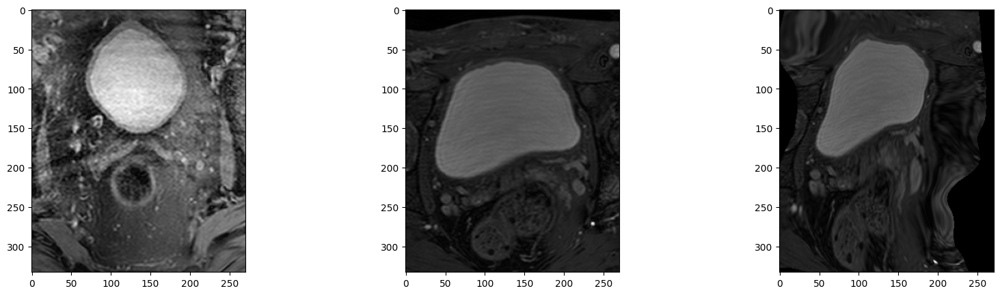

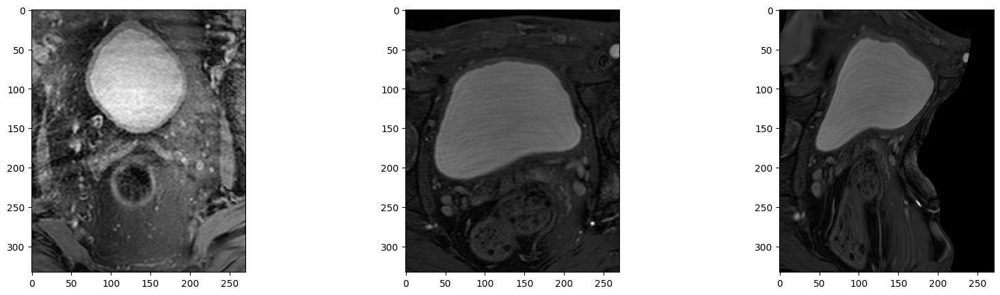

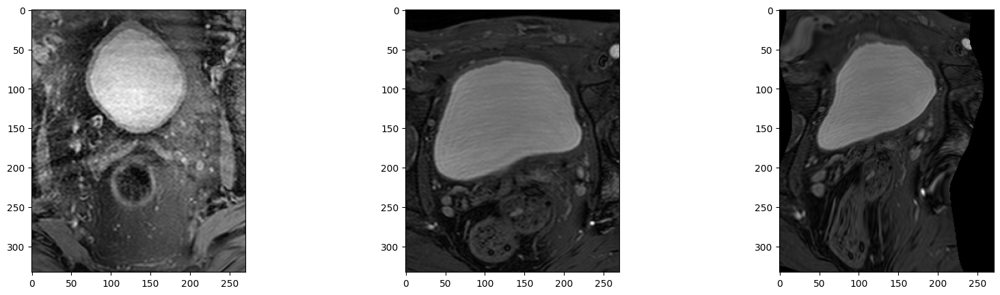

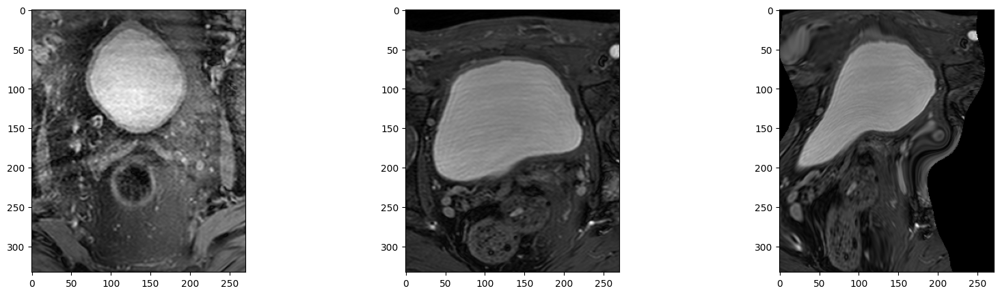

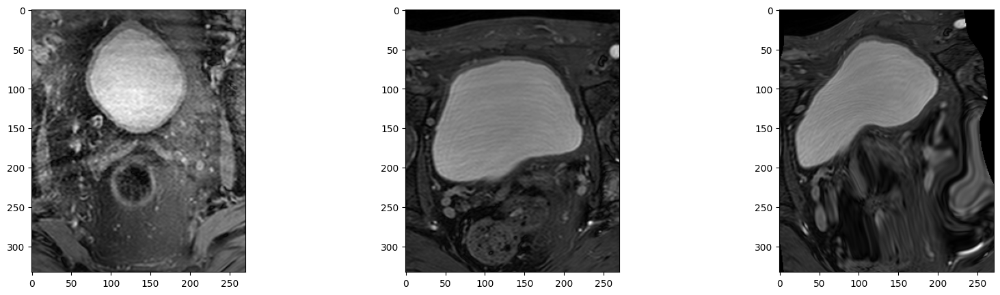

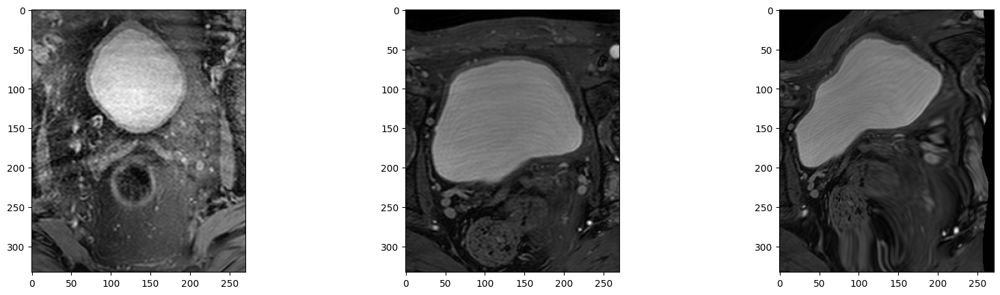

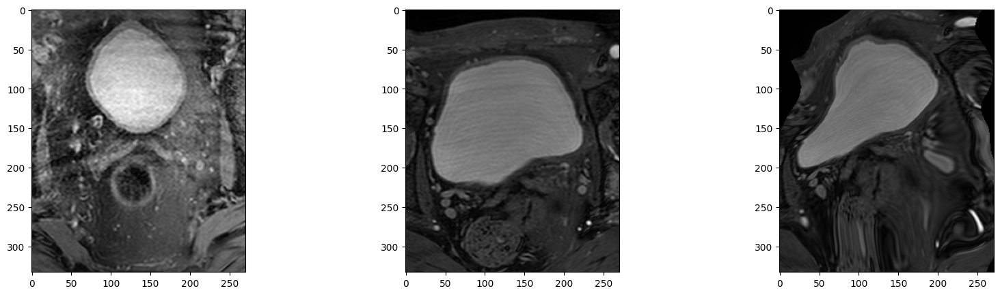

In [33]:
path_fixed = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_fixed, patient_fixed, 85)
for i in range(77,84):
    #fixed_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\p107_slice{}.mhd'.format(i)
    #moving_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\p108_slice{}.mhd'.format(i)
    path_moving = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    
    #if not os.path.exists(os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i))):
    #    os.makedirs(os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i)))
    #output_file_path_experiment1 = os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i))
    
    if not os.path.exists(os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i)))
    #output_file_path_experiment2 = os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i))
    output_file_path_bspline = os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))
    
      
    #itk_image_fixed = sitk.ReadImage(fixed_image_path2)
    itk_image_fixed = sitk.ReadImage(path_fixed)
    image_array_fixed = sitk.GetArrayFromImage(itk_image_fixed)
    
    #itk_image_moving = sitk.ReadImage(moving_image_path2)
    itk_image_moving = sitk.ReadImage(path_moving)
    image_array_moving = sitk.GetArrayFromImage(itk_image_moving)
    
    #result_path_experiment2 = os.path.join(output_file_path_experiment1, 'result.0.mhd')
    result_path_bspline = os.path.join(output_file_path_bspline, 'result.0.mhd') # in case of this the transformed moving image is black
    
    
    #transformed_moving_image = imageio.imread(result_path_experiment2)
    transformed_moving_image = imageio.imread(result_path_bspline)
    #itk_image_transformed = sitk.ReadImage(result_path_bspline)
    #image_array_transformed = sitk.GetArrayFromImage(itk_image_transformed)
    
    
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    ax[0].imshow(image_array_fixed[:,:], cmap='gray')
    ax[1].imshow(image_array_moving[:,:], cmap='gray')
    ax[2].imshow(transformed_moving_image[:,:], cmap='gray')
    #ax[2].imshow(image_array_transformed[:,:], cmap='gray')
    
    print(result_path_bspline)


### TRANSFORMIX AND JACOBIAN to see deformations

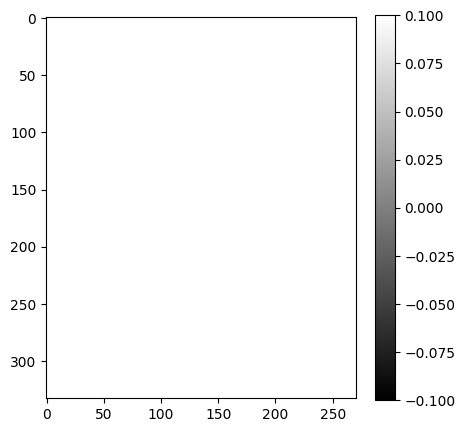

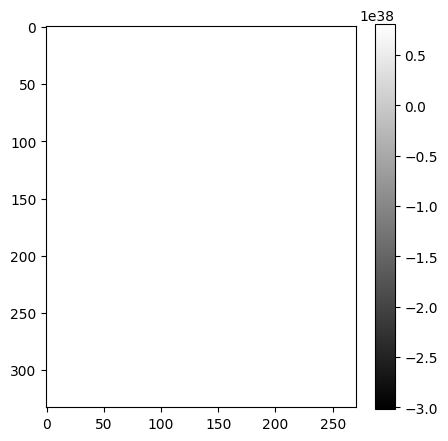

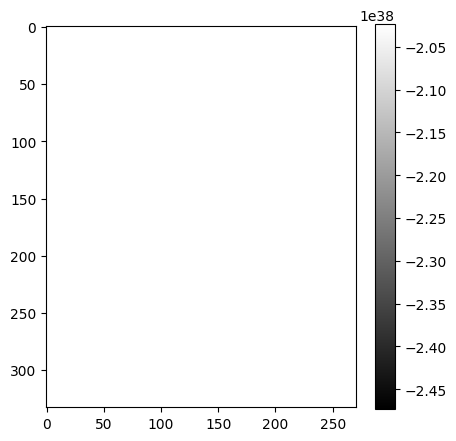

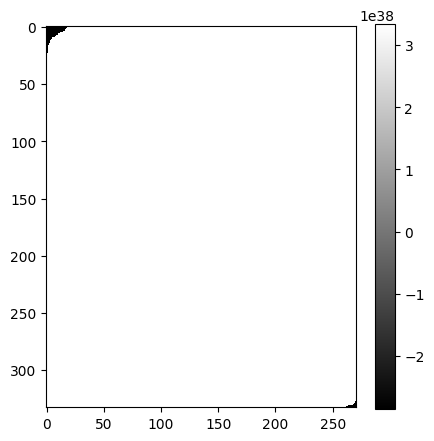

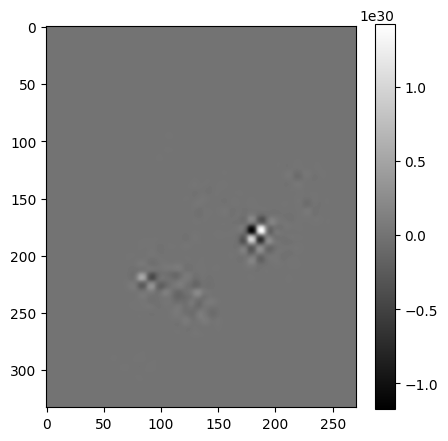

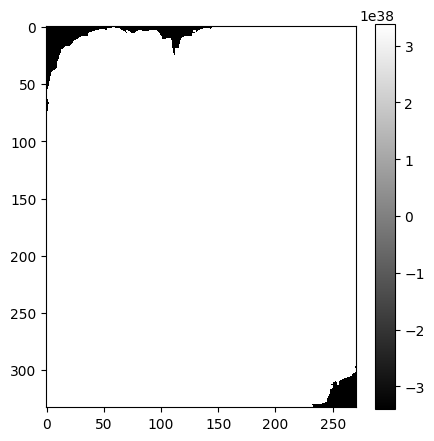

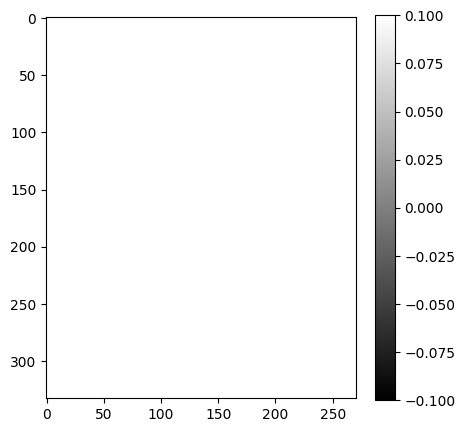

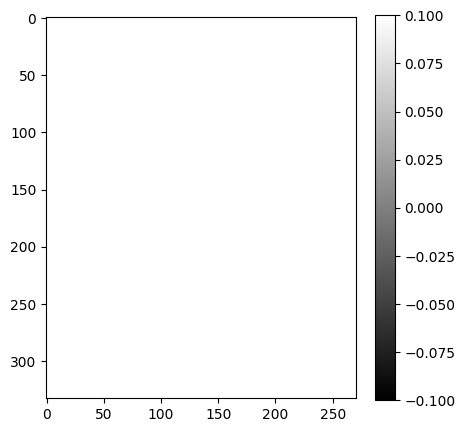

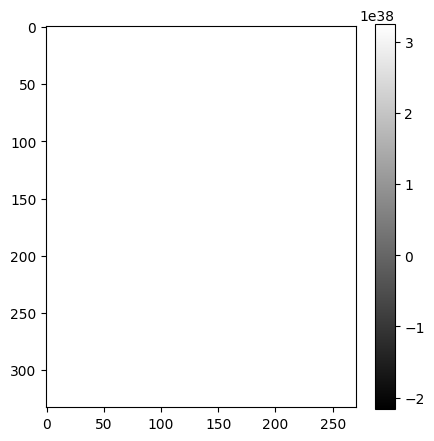

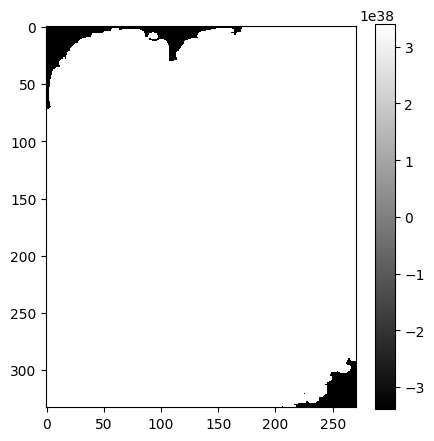

In [29]:
#TRANSFORMIX_PATH=r"C:\Users\20191679\Documents\Master\CS_image_analysis\transformix.exe"

for i in range(20,30):
    #if not os.path.exists(os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i))):
    #    os.makedirs(os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i)))
    #output_file_path_experiment2 = os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i))
    
    if not os.path.exists(os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i)))
    output_file_path_bspline = os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))
    
    #transform_path_im = os.path.join(output_file_path_experiment2,'TransformParameters.0.txt') # path to transform parameters file
    transform_path_im = os.path.join(output_file_path_bspline,'TransformParameters.0.txt') # path to transform parameters file
    
    tr = elastix.TransformixInterface(parameters=transform_path_im,
                                  transformix_path=TRANSFORMIX_PATH)
    
    # path to output folder
    #output_dir_jacobian=output_file_path_experiment2
    output_dir_jacobian=output_file_path_bspline
    
    jacobian_matrix_path = tr.jacobian_matrix(output_dir=output_dir_jacobian)
    
    # Get the Jacobian determinant
    jacobian_determinant_path = tr.jacobian_determinant(output_dir=output_dir_jacobian)
    
    # Get the full deformation field
    deformation_field_path = tr.deformation_field(output_dir=output_dir_jacobian)
    imb=imageio.imread(jacobian_determinant_path,level=0)
    
    # visualize jacobian
    plt.figure(figsize=(5,5))
    pos=plt.imshow(imb[:,:],cmap='gray')
    plt.colorbar(pos)

# TRANSFORMIX: use transform matrix to get the corresponding masks

## 1. Apply affine transformation to the masks

In [34]:
# create a 2D mask of each slice

#moving_image_path= r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\prostaat.mhd'
#fixed_image_path=  r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\prostaat.mhd'
fixed_mask_path = filepath_data+ '\{}\prostaat.mhd'.format(patient_fixed)
moving_mask_path = filepath_data+ '\{}\prostaat.mhd'.format(patient_moving)

itk_image_fixed = sitk.ReadImage(fixed_mask_path)
itk_image_moving = sitk.ReadImage(moving_mask_path)

for i in range(86): 
    #itk_img=itk_image_fixed[i,:,:] # itk_img is not used in the rest of this code, why was it there?
    itk_img_array_fixed = sitk.GetArrayFromImage(itk_image_fixed)
    slice = sitk.GetImageFromArray(itk_img_array_fixed[i,:,:])
    #path=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\mask_p107_slice{}.mhd'.format(i)
    path_fixed = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    sitk.WriteImage(slice,path_fixed)
    
    #itk_img_moving=itk_image_moving[i,:,:] # itk_img_moving is not used in the rest of this code, why was it there?
    itk_img_array_moving = sitk.GetArrayFromImage(itk_image_moving)
    slice = sitk.GetImageFromArray(itk_img_array_moving[i,:,:])
    path_moving = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    sitk.WriteImage(slice,path_moving)
    #sitk.WriteImage(slice, r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\mask_p108_slice{}.mhd'.format(i))



In [35]:
# to Transformix.exe
#TRANSFORMIX_PATH=r"C:\Users\20191679\Documents\Master\CS_image_analysis\transformix.exe"
# this path does not change right? so we don't need to use it again here

# Create a copy of the 'TransformParameters.0.txt' and name it 'TransformParameters.0b.txt'
# In the new file, change the (FinalBSplineInterpolationOrder 3) to value 0

for i in range(31): #86 for all slices
    if not os.path.exists(os.path.join(filepath_data,'{}\\affine_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\affine_results_{}'.format(patient_fixed,i)))
    #output_file_path_experiment2 = os.path.join(filepath_data,'p107\\affine_results_{}'.format(i))
    output_file_path_affine = os.path.join(filepath_data,'{}\\affine_results_{}'.format(patient_fixed,i))
    #transform_path = os.path.join(output_file_path_experiment2,'TransformParameters.0.txt') # path to transform paramters file
    transform_path = os.path.join(output_file_path_affine,'TransformParameters.0.txt')
        
      
    #target_path = os.path.join(output_file_path_experiment2,'TransformParameters.0b.txt')
    target_path = os.path.join(output_file_path_affine,'TransformParameters.0b.txt')
    shutil.copyfile(transform_path, target_path)
    
    with open(target_path,'r') as file:
        data=file.read()
        data=data.replace("(FinalBSplineInterpolationOrder 3)", "(FinalBSplineInterpolationOrder 0)")
        
    with open(target_path,'w') as file:
        
        file.write(data)
    

In [40]:
for i in range(31):
    #fixed_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\mask_p107_slice{}.mhd'.format(i)
    #moving_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\mask_p108_slice{}.mhd'.format(i)
    path_fixed_mask = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    path_moving_mask = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    
    #output_file_path_experiment2 = os.path.join(filepath_data,'p107\\affine_results_{}'.format(i))
    output_file_path_affine = os.path.join(filepath_data,'{}\\affine_results_{}'.format(patient_fixed,i))
    #target_path = os.path.join(output_file_path_experiment2,'TransformParameters.0b.txt')
    target_path = os.path.join(output_file_path_affine,'TransformParameters.0b.txt')
    
    #if not os.path.exists(os.path.join(filepath_data,'p107\\mask_affine_results_{}'.format(i))):
    #    os.makedirs(os.path.join(filepath_data,'p107\\mask_affine_results_{}'.format(i)))
    #output_file_path_experiment1 = os.path.join(filepath_data,'p107\\mask_affine_results_{}'.format(i))
    
    if not os.path.exists(os.path.join(filepath_data,'{}\\mask_affine_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\mask_affine_results_{}'.format(patient_fixed,i)))
    output_file_path_affine_mask = os.path.join(filepath_data,'{}\\mask_affine_results_{}'.format(patient_fixed,i))
    
    tr = elastix.TransformixInterface(parameters=target_path,
                                  transformix_path=TRANSFORMIX_PATH)
    
    # Transform the moving image mask with the transformation parameters
    #tr.transform_image(moving_image_path2, output_dir=output_file_path_experiment1)
    tr.transform_image(path_moving_mask, output_dir=output_file_path_affine_mask)
    


C:\Users\esmee\AppData\Local\Temp\ipykernel_1700\3732584548.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(20, 5))


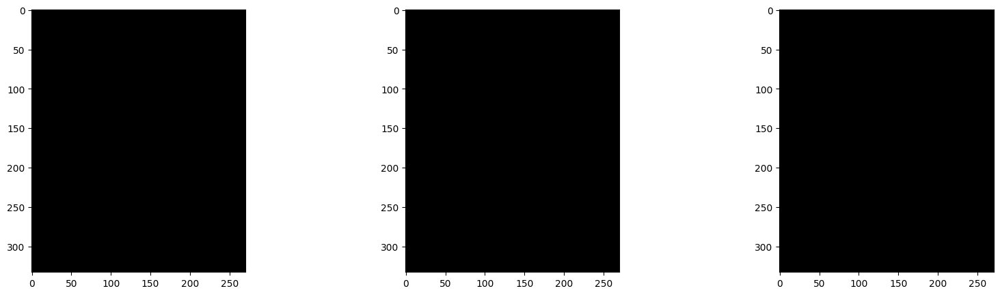

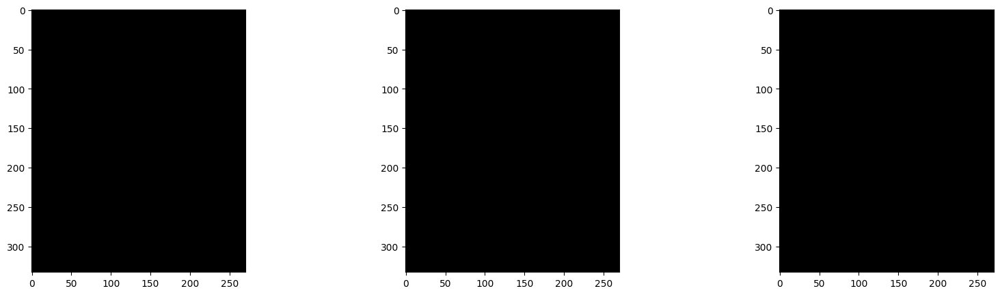

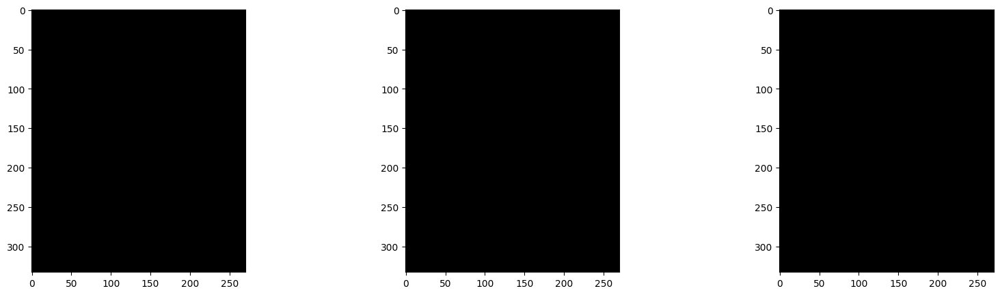

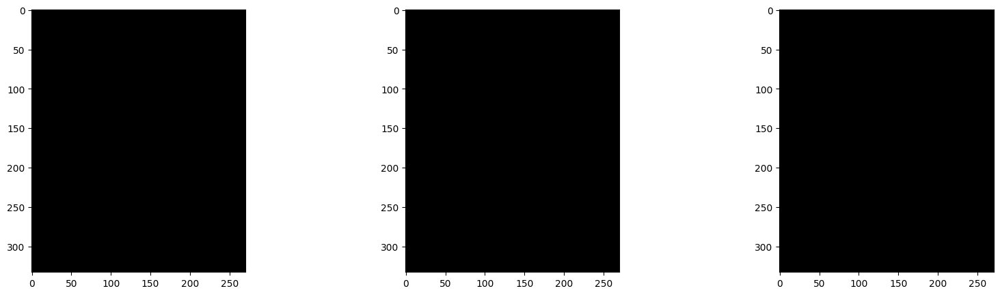

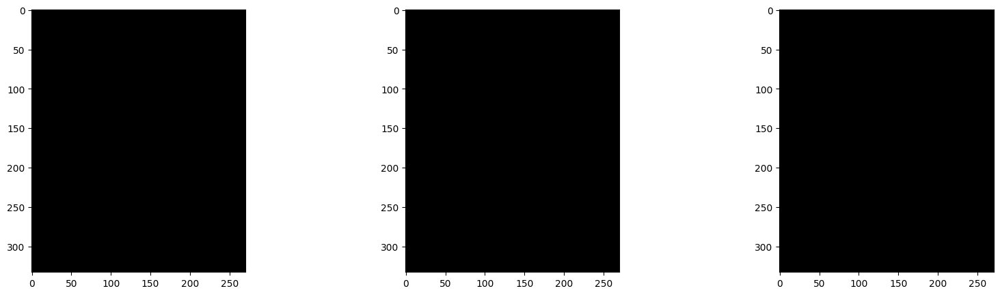

...

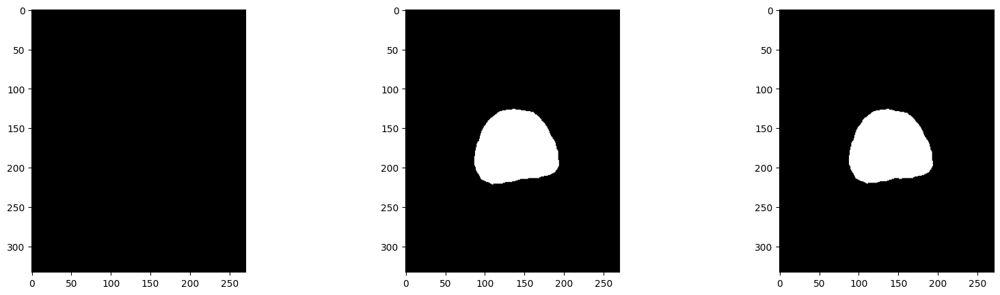

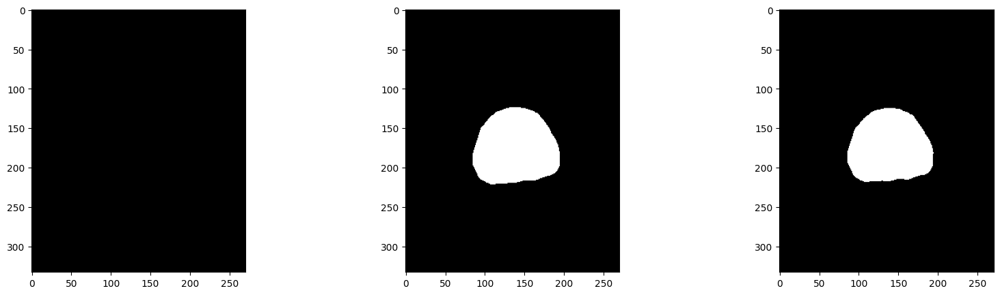

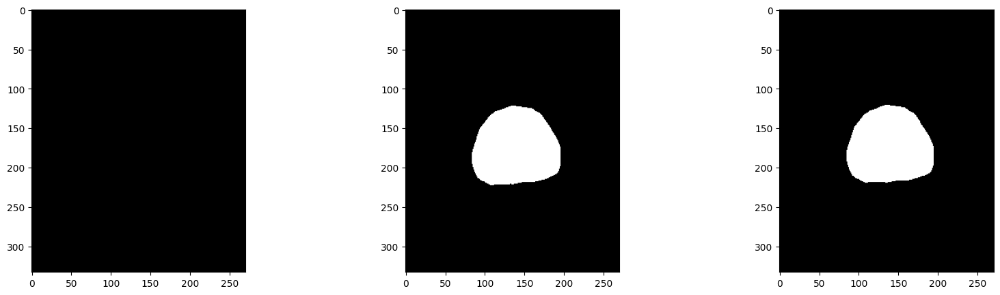

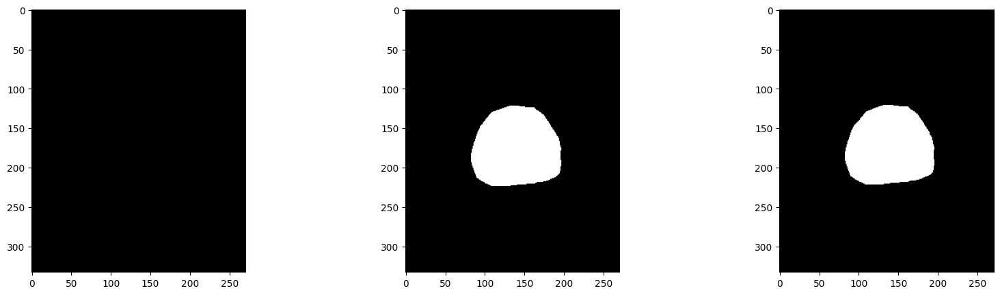

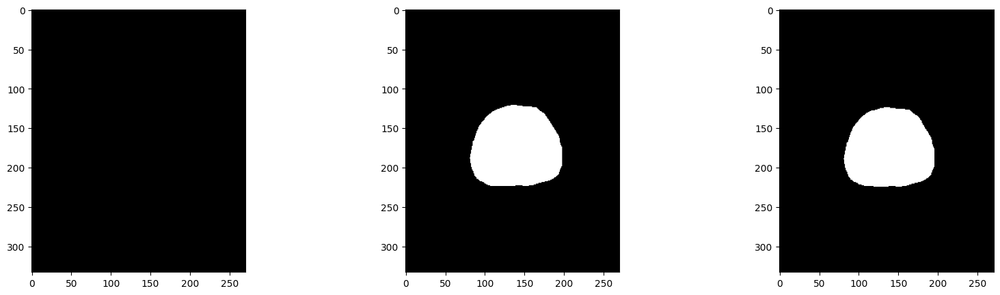

In [41]:
for i in range(31):
    #fixed_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\mask_p107_slice{}.mhd'.format(i)
    #moving_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\mask_p108_slice{}.mhd'.format(i)
    path_fixed_mask = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    path_moving_mask = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    
    #if not os.path.exists(os.path.join(filepath_data,'p107\\mask_affine_results_{}'.format(i))):
    #    os.makedirs(os.path.join(filepath_data,'p107\\mask_affine_results_{}'.format(i)))
    #output_file_path_experiment1 = os.path.join(filepath_data,'p107\\mask_affine_results_{}'.format(i))
    
    if not os.path.exists(os.path.join(filepath_data,'{}\\mask_affine_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\mask_affine_results_{}'.format(patient_fixed,i)))
    output_file_path_affine_mask = os.path.join(filepath_data,'{}\\mask_affine_results_{}'.format(patient_fixed,i))
    
    #itk_image_fixed = sitk.ReadImage(fixed_image_path2)
    itk_image_fixed = sitk.ReadImage(path_fixed_mask)
    image_array_fixed = sitk.GetArrayFromImage(itk_image_fixed)
    
    #itk_image_moving = sitk.ReadImage(moving_image_path2)
    itk_image_moving = sitk.ReadImage(path_moving_mask)
    image_array_moving = sitk.GetArrayFromImage(itk_image_moving)
    
    #result_path_experiment1 = os.path.join(output_file_path_experiment1, 'result.mhd')
    result_path_affine_mask = os.path.join(output_file_path_affine_mask, 'result.mhd')
    #transformed_moving_image = imageio.imread(result_path_experiment1)
    transformed_moving_image = imageio.imread(result_path_affine_mask)
    
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    ax[0].imshow(image_array_fixed[:,:], cmap='gray')
    ax[1].imshow(image_array_moving[:,:], cmap='gray')
    ax[2].imshow(transformed_moving_image[:,:], cmap='gray')

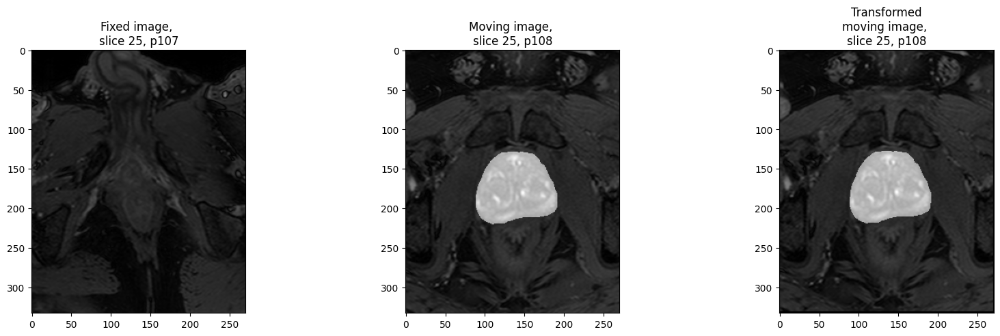

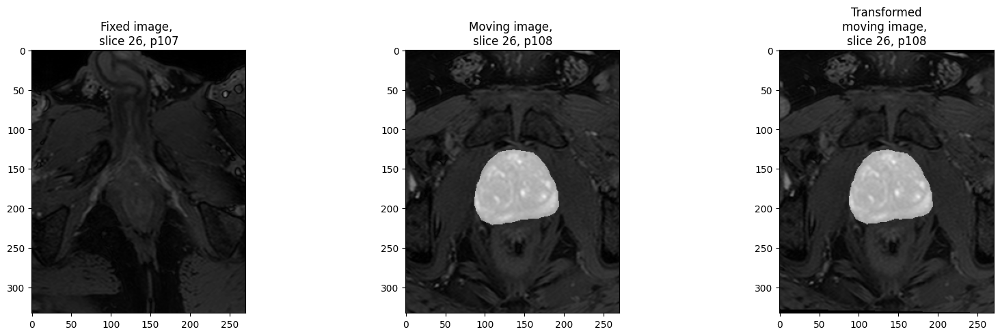

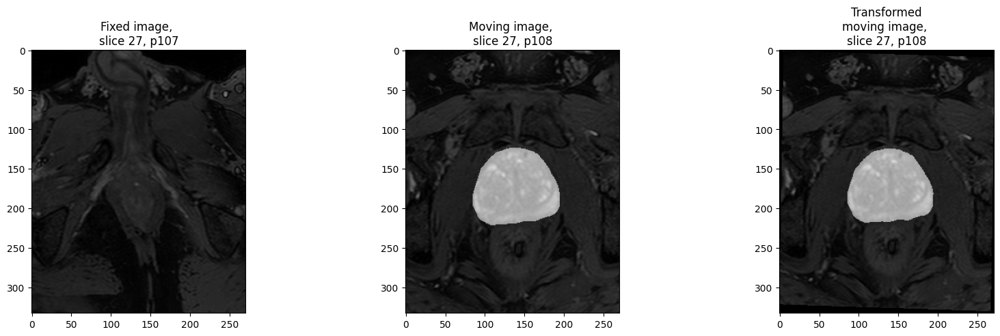

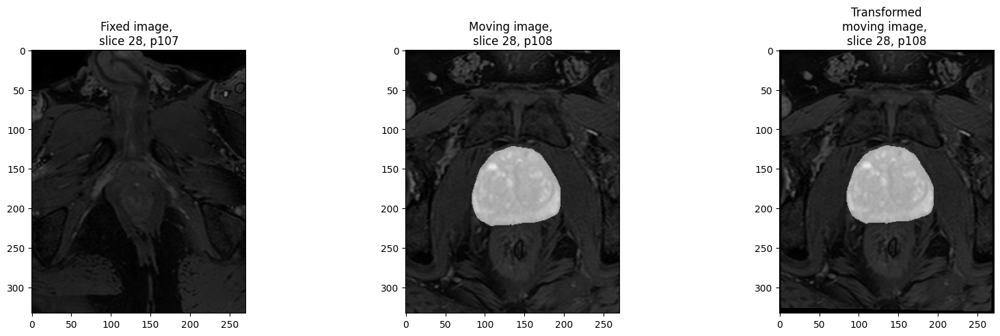

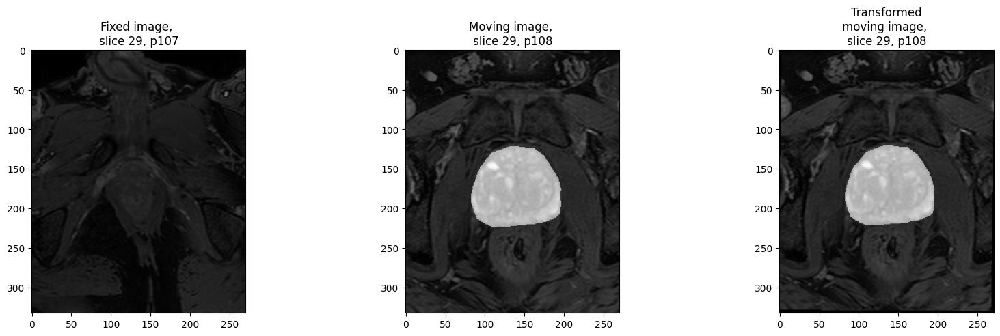

In [43]:
# visualize the masks over the images

for i in range(25,30):
    #fixed_image_path_IM=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\p107_slice{}.mhd'.format(i)
    #moving_image_path_IM=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\p108_slice{}.mhd'.format(i)
    path_fixed_IM = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    path_moving_IM = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    #output_file_path_experiment_IM = os.path.join(filepath_data,'p107\\results_{}'.format(i)) #change to affine!
    output_file_path_IM = os.path.join(filepath_data,'{}\\affine_results_{}'.format(patient_fixed,i))
    
    #result_path_experiment_IM = os.path.join(output_file_path_experiment_IM, 'result.0.mhd')
    result_path_IM = os.path.join(output_file_path_IM, 'result.0.mhd')
    #readable_fixed_image_path_IM = imageio.imread(fixed_image_path_IM)
    readable_fixed_image_path_IM = imageio.imread(path_fixed_IM)
    #readable_moving_image_path_IM = imageio.imread(moving_image_path_IM)
    readable_moving_image_path_IM = imageio.imread(path_moving_IM)
    #transformed_moving_image_IM = imageio.imread(result_path_experiment_IM)
    transformed_moving_image_IM = imageio.imread(result_path_IM)
    
    #fixed_image_path_MASK=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\mask_p107_slice{}.mhd'.format(i)
    #moving_image_path_MASK=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\mask_p108_slice{}.mhd'.format(i)
    path_fixed_MASK = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    path_moving_MASK = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    
    #output_file_path_experiment_MASK = os.path.join(filepath_data,'p107\\mask_affine_results_{}'.format(i))
    output_file_path_MASK = os.path.join(filepath_data,'{}\\mask_affine_results_{}'.format(patient_fixed,i))
    
    #itk_image_fixed = sitk.ReadImage(fixed_image_path_MASK)
    itk_image_fixed = sitk.ReadImage(path_fixed_MASK)
    image_array_fixed = sitk.GetArrayFromImage(itk_image_fixed)
    
    #itk_image_moving = sitk.ReadImage(moving_image_path_MASK)
    itk_image_moving = sitk.ReadImage(path_moving_MASK)
    image_array_moving = sitk.GetArrayFromImage(itk_image_moving)
    
    #result_path_experiment_MASK = os.path.join(output_file_path_experiment_MASK, 'result.mhd')
    result_path_MASK = os.path.join(output_file_path_MASK, 'result.mhd')
    #transformed_moving_image_MASK = imageio.imread(result_path_experiment_MASK)
    transformed_moving_image_MASK = imageio.imread(result_path_MASK)
    

    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    
    ax[0].imshow(readable_fixed_image_path_IM[:,:], cmap='gray')
    ax[0].imshow(image_array_fixed[:,:], cmap='gray', alpha=0.5)
    ax[0].set_title('Fixed image, \nslice {}, {}'.format(i, patient_fixed))
    
    ax[1].imshow(readable_moving_image_path_IM[:,:], cmap='gray')
    ax[1].imshow(image_array_moving[:,:], cmap='gray', alpha=0.5)
    ax[1].set_title('Moving image, \nslice {}, {}'.format(i, patient_moving))
    
    ax[2].imshow(transformed_moving_image_IM[:,:], cmap='gray')
    ax[2].imshow(transformed_moving_image_MASK[:,:], cmap='gray', alpha=0.5)
    ax[2].set_title('Transformed\nmoving image, \nslice {}, {}'.format(i, patient_moving))
    
    plt.show()
    

## 2. Apply b-spline transformation to the masks

In [44]:
# to Transformix.exe
#TRANSFORMIX_PATH=r"C:\Users\20191679\Documents\Master\CS_image_analysis\transformix.exe"
# this path does not change right? so we don't need to use it again here

# Create a copy of the 'TransformParameters.0.txt' and name it 'TransformParameters.0b.txt'
# In the new file, change the (FinalBSplineInterpolationOrder 3) to value 0


for i in range(31): #86 for all slices
    if not os.path.exists(os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i)))
    #output_file_path_experiment2 = os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i))
    output_file_path_bspline = os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))
    #transform_path = os.path.join(output_file_path_experiment2,'TransformParameters.0.txt') # path to transform paramters file
    transform_path = os.path.join(output_file_path_bspline,'TransformParameters.0.txt')
    
    #target_path = os.path.join(output_file_path_experiment2,'TransformParameters.0b.txt')
    target_path = os.path.join(output_file_path_bspline,'TransformParameters.0b.txt')
    shutil.copyfile(transform_path, target_path)
    
    with open(target_path,'r') as file:
        data=file.read()
        data=data.replace("(FinalBSplineInterpolationOrder 3)", "(FinalBSplineInterpolationOrder 0)")
        
    with open(target_path,'w') as file:
        
        file.write(data)
        


In [48]:
for i in range(31):
    #fixed_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\mask_p107_slice{}.mhd'.format(i)
    #moving_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\mask_p108_slice{}.mhd'.format(i)
    path_fixed_mask = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    path_moving_mask = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    #output_file_path_experiment2 = os.path.join(filepath_data,'p107\\bspline_results_{}'.format(i))
    output_file_path_bspline = os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))
    #target_path = os.path.join(output_file_path_experiment2,'TransformParameters.0b.txt')
    target_path = os.path.join(output_file_path_bspline,'TransformParameters.0b.txt')
    
    if not os.path.exists(os.path.join(filepath_data,'{}\\mask_bspline_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\mask_bspline_results_{}'.format(patient_fixed,i)))
    #output_file_path_experiment1 = os.path.join(filepath_data,'p107\\mask_bspline_results_{}'.format(i))
    output_file_path_bspline_mask = os.path.join(filepath_data,'{}\\mask_bspline_results_{}'.format(patient_fixed,i))
    
    tr = elastix.TransformixInterface(parameters=target_path,
                                  transformix_path=TRANSFORMIX_PATH)
    
    # Transform the moving image mask with the transformation parameters
    #tr.transform_image(moving_image_path2, output_dir=output_file_path_experiment1)
    tr.transform_image(path_moving_mask, output_dir=output_file_path_bspline_mask)
    


C:\Users\esmee\AppData\Local\Temp\ipykernel_1700\264336699.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(20, 5))


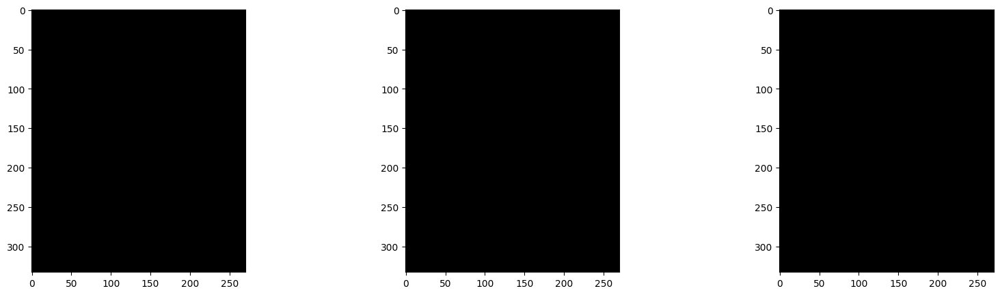

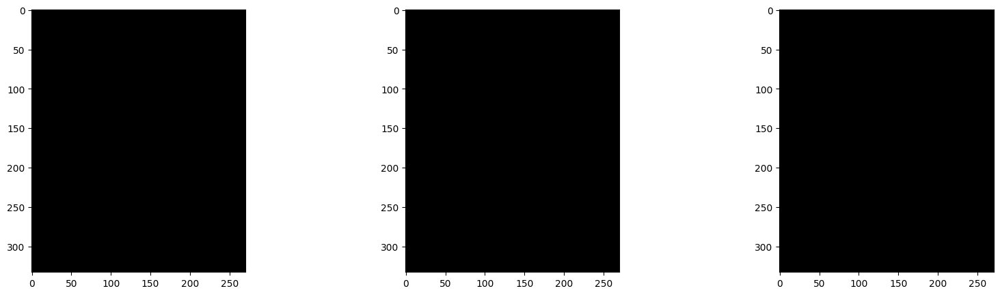

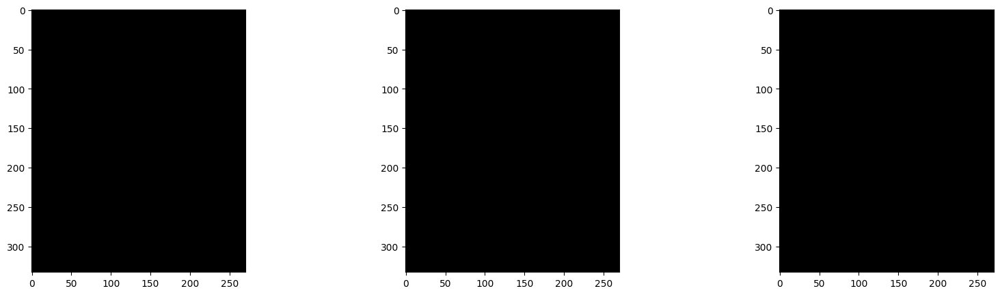

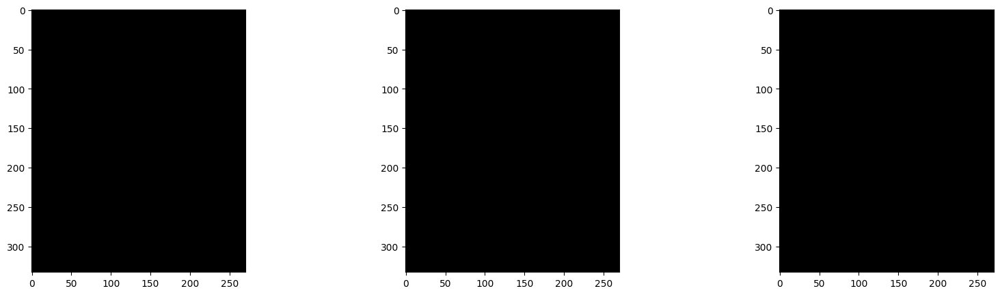

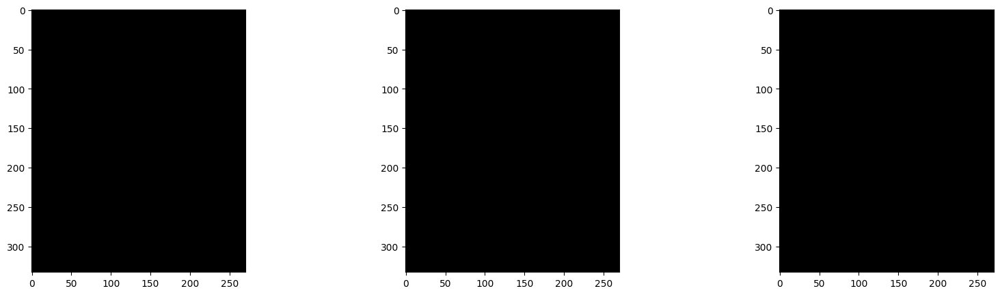

...

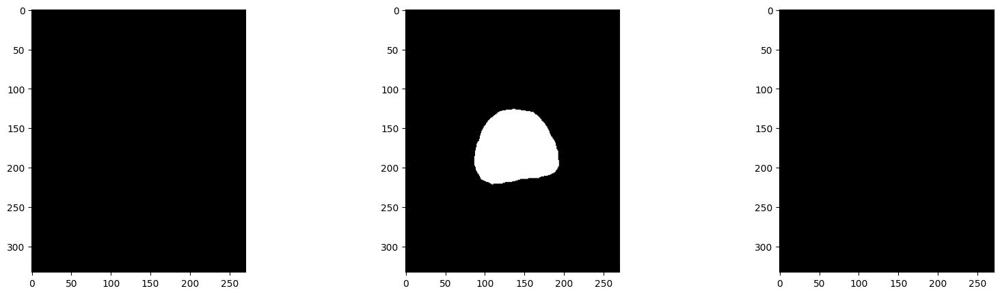

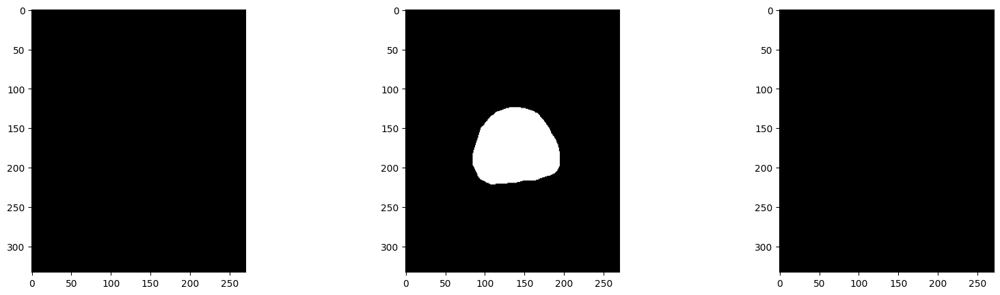

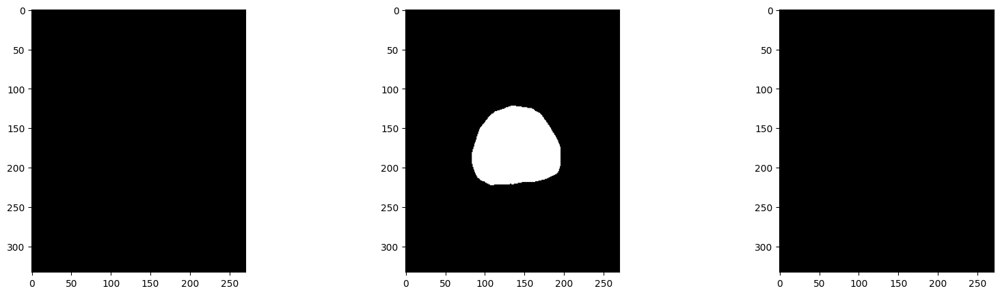

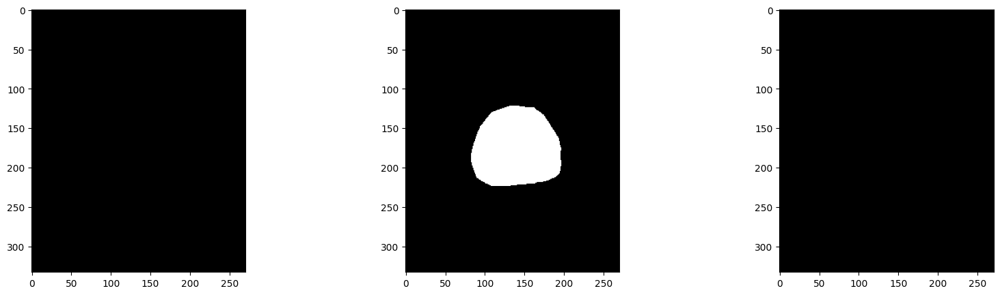

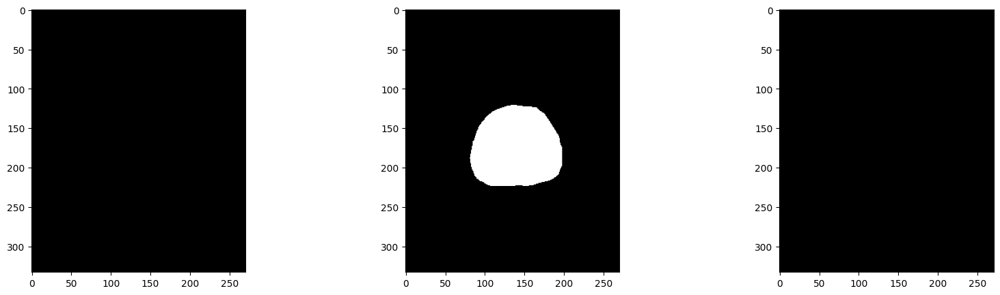

In [49]:
for i in range(31):
    #fixed_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p107\mask_p107_slice{}.mhd'.format(i)
    #moving_image_path2=r'C:\Users\20191679\Documents\Master\CS_image_analysis\TrainingData\p108\mask_p108_slice{}.mhd'.format(i)
    path_fixed_mask = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    path_moving_mask = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    
    if not os.path.exists(os.path.join(filepath_data,'{}\\mask_bspline_results_{}'.format(patient_fixed,i))):
        os.makedirs(os.path.join(filepath_data,'{}\\mask_bspline_results_{}'.format(patient_fixed,i)))
    #output_file_path_experiment1 = os.path.join(filepath_data,'p107\\mask_bspline_results_{}'.format(i))
    output_file_path_bspline_mask = os.path.join(filepath_data,'{}\\mask_bspline_results_{}'.format(patient_fixed,i))
    
    #itk_image_fixed = sitk.ReadImage(fixed_image_path2)
    itk_image_fixed = sitk.ReadImage(path_fixed_mask)
    image_array_fixed = sitk.GetArrayFromImage(itk_image_fixed)
    
    #itk_image_moving = sitk.ReadImage(moving_image_path2)
    itk_image_moving = sitk.ReadImage(path_moving_mask)
    image_array_moving = sitk.GetArrayFromImage(itk_image_moving)
    
    #result_path_experiment1 = os.path.join(output_file_path_experiment1, 'result.mhd')
    result_path_bspline_mask = os.path.join(output_file_path_bspline_mask, 'result.mhd')
    #transformed_moving_image = imageio.imread(result_path_experiment1)
    transformed_moving_image = imageio.imread(result_path_bspline_mask)
    
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    ax[0].imshow(image_array_fixed[:,:], cmap='gray')
    ax[1].imshow(image_array_moving[:,:], cmap='gray')
    ax[2].imshow(transformed_moving_image[:,:], cmap='gray')

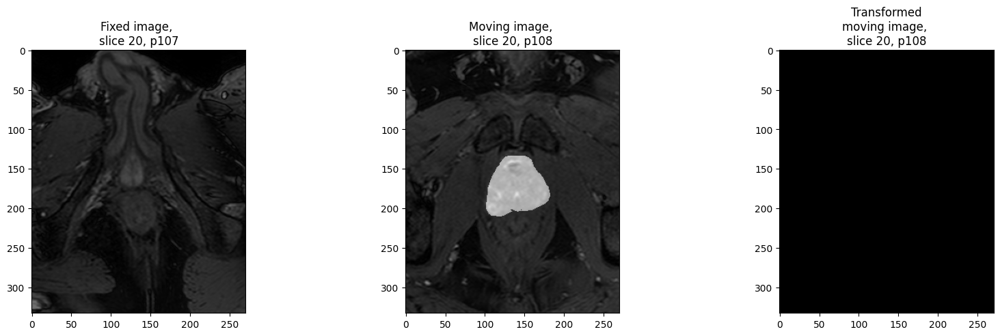

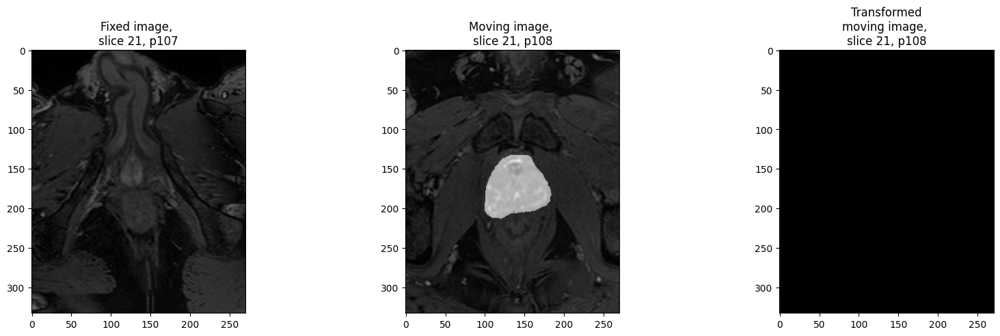

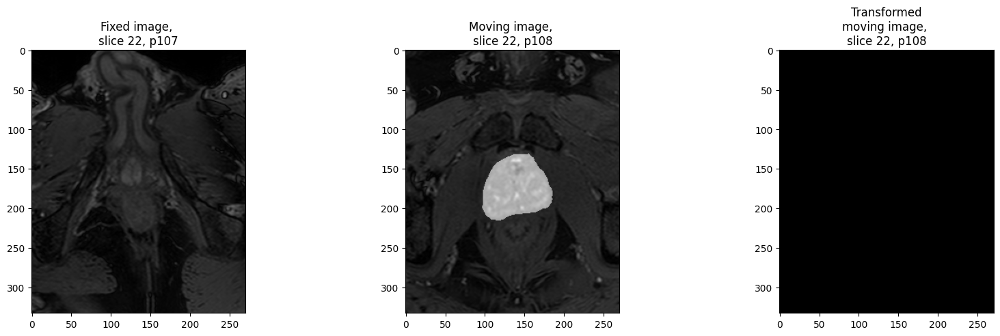

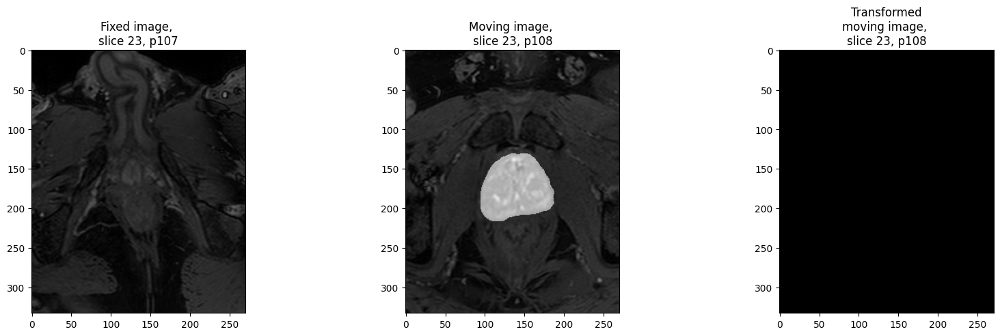

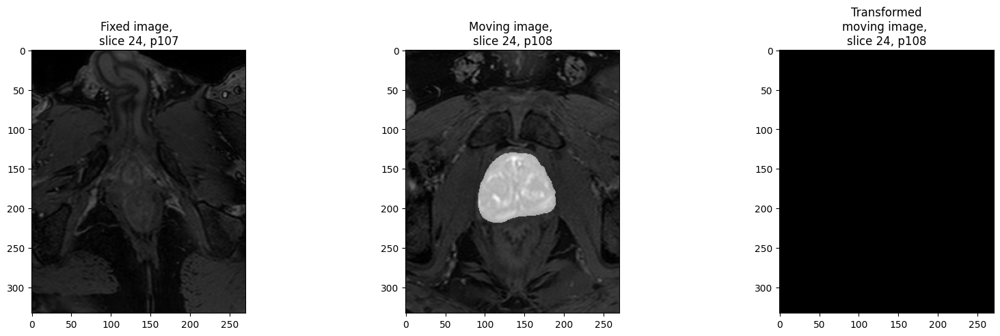

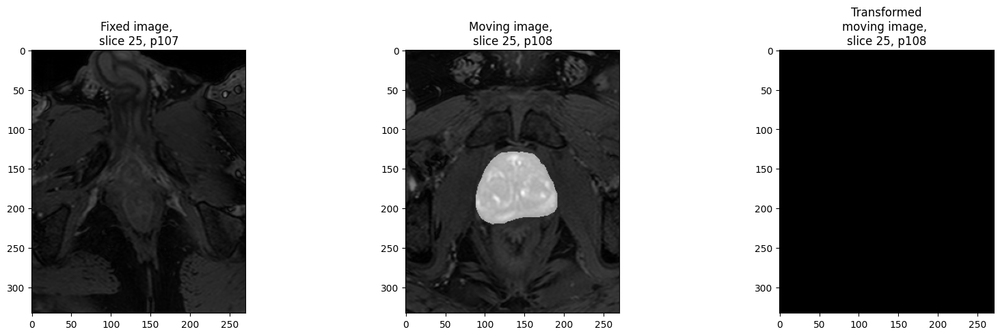

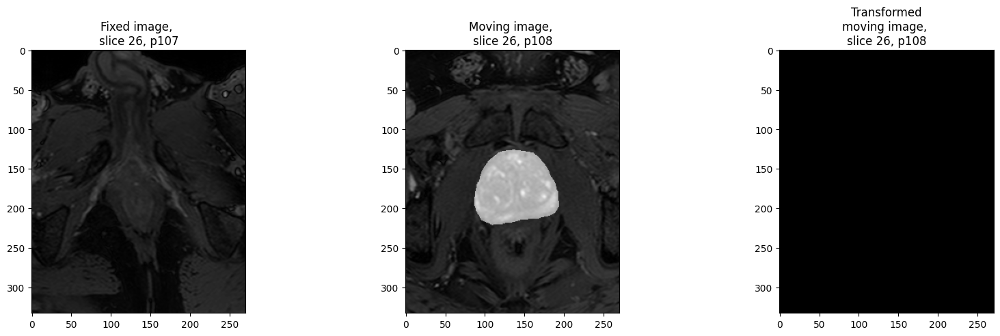

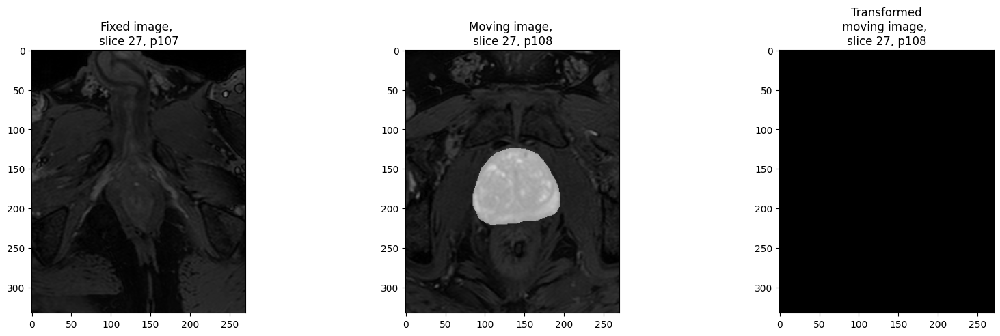

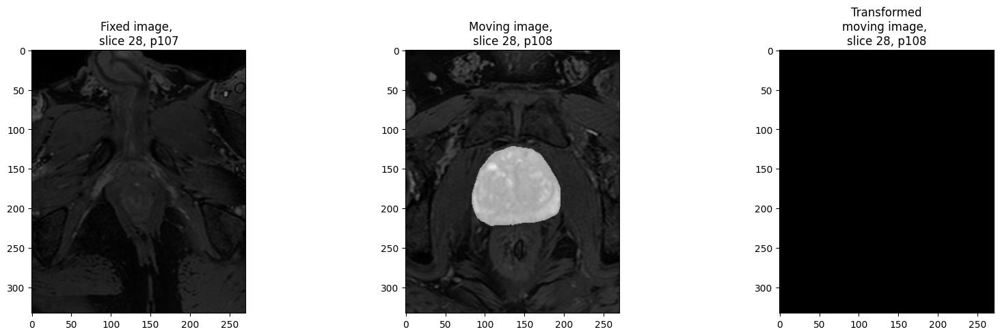

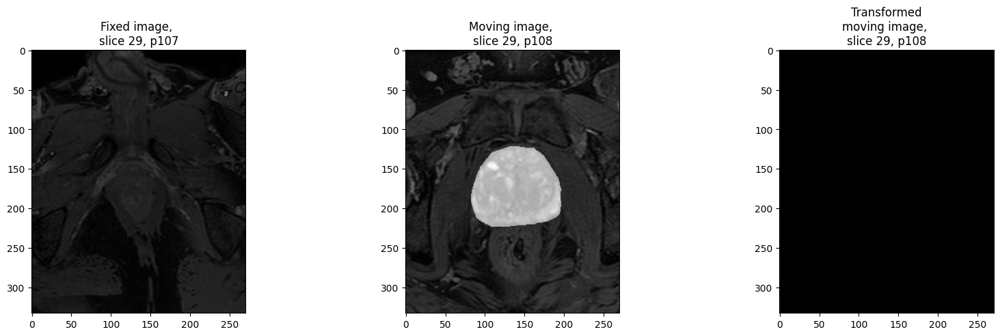

In [51]:
# visualize the masks over the images

for i in range(20,30):
    path_fixed_IM = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    path_moving_IM = filepath_data+ '\{}\{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    output_file_path_IM = os.path.join(filepath_data,'{}\\bspline_results_{}'.format(patient_fixed,i))
        
    result_path_IM = os.path.join(output_file_path_IM, 'result.0.mhd')
    readable_fixed_image_path_IM = imageio.imread(path_fixed_IM)
    readable_moving_image_path_IM = imageio.imread(path_moving_IM)
    transformed_moving_image_IM = imageio.imread(result_path_IM)
    
    
    path_fixed_MASK = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_fixed, patient_fixed, i)
    path_moving_MASK = filepath_data+ '\{}\mask_{}_slice{}.mhd'.format(patient_moving, patient_moving, i)
    output_file_path_MASK = os.path.join(filepath_data,'{}\\mask_bspline_results_{}'.format(patient_fixed,i))
    
    itk_image_fixed = sitk.ReadImage(path_fixed_MASK)
    image_array_fixed = sitk.GetArrayFromImage(itk_image_fixed)
    itk_image_moving = sitk.ReadImage(path_moving_MASK)
    image_array_moving = sitk.GetArrayFromImage(itk_image_moving)
    
    result_path_MASK = os.path.join(output_file_path_MASK, 'result.mhd')
    transformed_moving_image_MASK = imageio.imread(result_path_MASK)
    

    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    
    ax[0].imshow(readable_fixed_image_path_IM[:,:], cmap='gray')
    ax[0].imshow(image_array_fixed[:,:], cmap='gray', alpha=0.5)
    ax[0].set_title('Fixed image, \nslice {}, {}'.format(i, patient_fixed))
    
    ax[1].imshow(readable_moving_image_path_IM[:,:], cmap='gray')
    ax[1].imshow(image_array_moving[:,:], cmap='gray', alpha=0.5)
    ax[1].set_title('Moving image, \nslice {}, {}'.format(i, patient_moving))
    
    ax[2].imshow(transformed_moving_image_IM[:,:], cmap='gray')
    ax[2].imshow(transformed_moving_image_MASK[:,:], cmap='gray', alpha=0.5)
    ax[2].set_title('Transformed\nmoving image, \nslice {}, {}'.format(i, patient_moving))
    
    plt.show()
    

### Random split between test and other data
### This is not needed after the transformation, if used in the right location this can be removed here!

In [84]:
import random

#Pick random samples to be test data

patient_nrs_list = ['p102','p107', 'p108', 'p109', 'p115', 'p116', 'p117', 
                    'p119', 'p120', 'p125', 'p127','p128', 'p129', 'p133', 'p135']
random.seed(103)
ran=random.sample(patient_nrs_list, 3)

print(ran)

['p128', 'p119', 'p135']


In [79]:
import shutil
#Move test data to other destination
for i in range(3):
    path_test=filepath_data+'\Test' 
    print(path_test)
    path_old=file_p_mr = filepath_data+ '\{}'.format(ran[i])
    print(path_old)
    shutil.move(file_p_mr, path_test)
    

C:\Users\pauli\Desktop\UNI\UTRECHT\3RD PERIOD COURSES\CAPITA_SELECTA\group project\TrainingData\TrainingData\Test
C:\Users\pauli\Desktop\UNI\UTRECHT\3RD PERIOD COURSES\CAPITA_SELECTA\group project\TrainingData\TrainingData\p129
C:\Users\pauli\Desktop\UNI\UTRECHT\3RD PERIOD COURSES\CAPITA_SELECTA\group project\TrainingData\TrainingData\Test
C:\Users\pauli\Desktop\UNI\UTRECHT\3RD PERIOD COURSES\CAPITA_SELECTA\group project\TrainingData\TrainingData\p120
C:\Users\pauli\Desktop\UNI\UTRECHT\3RD PERIOD COURSES\CAPITA_SELECTA\group project\TrainingData\TrainingData\Test
C:\Users\pauli\Desktop\UNI\UTRECHT\3RD PERIOD COURSES\CAPITA_SELECTA\group project\TrainingData\TrainingData\p109


In [82]:
#remove test data from training patient list
print(patient_nrs_list)
patient_nrs_list

for j in range(len(patient_nrs_list)):
    if patient_nrs_list[j] in ran:
        patient_nrs_list.remove(patient_nrs_list[j])

print(patient_nrs_list)

['p102', 'p107', 'p108', 'p115', 'p116', 'p117', 'p125', 'p127', 'p128', 'p133']
['p102', 'p107', 'p108', 'p115', 'p116', 'p117', 'p125', 'p127', 'p128', 'p133']


In [83]:
import numpy as np


X_train=[] #dataset for cross validation
Y_train=[] #labels for cross validation
for k in range(len(patient_nrs_list)):
    file_p_mr = filepath_data+ '\{}\mr_bffe.mhd'.format(patient_nrs_list[k])
    file_p_mask = filepath_data+'\{}\prostaat.mhd'.format(patient_nrs_list[k]) 
    readable_mr = imageio.imread(file_p_mr)
    readable_mask=imageio.imread(file_p_mask)
    X_train.append(readable_mr)
    Y_train.append(readable_mask)


X_train=np.array(X_train)
Y_train=np.array(Y_train)
print(X_train.shape)
print(Y_train.shape)

FileNotFoundError: No such file: 'C:\Users\pauli\Desktop\UNI\UTRECHT\3RD PERIOD COURSES\CAPITA_SELECTA\group project\TrainingData\TrainingData\p128\mr_bffe.mhd'

# **STAPLE**
### This part is not edited by Giulia and Esmee, so after combining the this script with the weighted majority voting script, this part needs to be implemented correctly
Staple is a function which combines atlases. I was just curious to what it would do so just wrote some code to implement it. It is supposed to be a weighted voting algorithm but I am not exactly sure how it operates and if it works well. But maybe it could work after registering the atlases for each slice?


In [77]:
segs=['seg_0','seg_1','seg_2','seg_3','seg_4','seg_5','seg_6','seg_7','seg_8','seg_9','seg_10','seg_11']
seg_data=[]
for i in range(len(patient_nrs_list)):
    file_p_mask = filepath_data+'\{}\prostaat.mhd'.format(patient_nrs_list[i])
    readable_mask=imageio.imread(file_p_mask)
    segs[i]= readable_mask
    seg_data.append(segs[i])

FileNotFoundError: No such file: 'C:\Users\pauli\Desktop\UNI\UTRECHT\3RD PERIOD COURSES\CAPITA_SELECTA\group project\TrainingData\TrainingData\p119\prostaat.mhd'

In [ ]:
# STAPLE is availabe as a SITK package. To use, convert segmentations to SITK image objects
import numpy as np
segs=['seg_0','seg_1','seg_2','seg_3','seg_4','seg_5','seg_6','seg_7','seg_8','seg_9','seg_10','seg_11']
segs_itk=['seg0_itk','seg1_itk','seg2_itk','seg3_itk','seg4_itk','seg5_itk','seg6_itk','seg7_itk','seg8_itk','seg9_itk','seg10_itk','seg11_itk']

seg_stack=[]
for i in range(len(segs)):
    segs[i]=seg_data[i]
    segs_itk[i]= sitk.GetImageFromArray(seg_data[i].astype(np.int16))
    seg_stack.append(segs_itk[i])


# Run STAPLE algorithm
STAPLE_seg_sitk = sitk.STAPLE(seg_stack,1, 1.0)# 1.0 specifies the foreground value


# convert back to numpy array
STAPLE_seg = sitk.GetArrayFromImage(STAPLE_seg_sitk)
#STAPLE_seg =imageio.imread(STAPLE_seg_sitk)

In [ ]:
print(STAPLE_seg.shape[1])

for i in range(STAPLE_seg.shape[0]):
    for j in range(STAPLE_seg.shape[1]):
        for k in range(STAPLE_seg.shape[2]):
            if STAPLE_seg[i,j,k]<0.5:
                STAPLE_seg[i,j,k]=0
            else:
                STAPLE_seg[i,j,k]=1

In [ ]:
for i in range(STAPLE_seg.shape[0]):
    fig, ax= plt.subplots(1, 3, figsize=(15,3))
    ax[0].imshow(STAPLE_seg[i,:,:], cmap='gray')
    ax[1].imshow(seg_data[10][i,:,:], cmap='gray')
    ax[2].imshow(readable_mr[i,:,:],cmap='gray')
    ax[2].imshow(STAPLE_seg[i,:,:], cmap='gray',alpha=0.3)
    plt.show()